In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scanpy as sc
from scipy import stats
import os

from scipy import spatial
from scipy import sparse
from scipy.interpolate import CubicSpline
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
import networkx as nx
from umap import UMAP

import json

In [2]:
import importlib

from scroutines import powerplots
from scroutines.miscu import is_in_polygon

import utils_merfish
importlib.reload(utils_merfish)
from utils_merfish import rot2d, st_scatter, st_scatter_ax, plot_cluster, binning
from utils_merfish import RefLineSegs

from merfish_datasets import merfish_datasets
directories = merfish_datasets
directories

{'P14NR_ant': 'merfish_06142023/ant/region0',
 'P28NR_ant': 'merfish_06142023/ant/region1',
 'P14NR_pos': 'merfish_06142023/pos/region0',
 'P28NR_pos': 'merfish_06142023/pos/region1',
 'P21NR_ant': 'merfish_20231114/region0',
 'P21DR_ant': 'merfish_20231114/region2',
 'P28DR_ant': 'merfish_20231114/region1',
 'P21NR_pos': 'merfish_20231120/region0',
 'P21DR_pos': 'merfish_20231120/region1',
 'P28DR_pos': 'merfish_20231120/region2'}

In [3]:
def get_qc_metrics(df):
    """
    return metrics
     - key
      - (name, val, medval, bins)
    """
    metrics = {}
    cols  = ['volume', 'gncov', 'gnnum']
    names = ['cell volume', 'num transcripts', 'num genes']
    
    for col, name in zip(cols, names):
        val = df[col].values
        medval = np.median(val)
        bins = np.linspace(0, 10*medval, 50)
        
        metrics[col] = (name, val, medval, bins)
    return metrics

def get_norm_counts(adata, scaling=500):
    """norm - equalize the volume to be 500 for all cells
    """
    cnts = adata.X
    vol = adata.obs['volume'].values
    normcnts = cnts/vol.reshape(-1,1)*scaling
    adata.layers['norm'] = normcnts
    
    return normcnts

In [4]:
def get_largest_spatial_components(adata, k=100, dist_th=80):
    """
    k - number of neighbors
    dist_th - distance to call connected components
    
    returns
        - indices of the largest components
    """
    XY = adata.obs[['x', 'y']].values
    nc = len(XY)

    # kNN
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='auto').fit(XY)
    distances, indices = nbrs.kneighbors(XY)

    # filtered by distance th
    val = distances[:,1:].reshape(-1,)
    i = np.repeat(indices[:,0],k-1)
    j = indices[:,1:].reshape(-1,)

    indices_filtered = np.vstack([i[val < dist_th], j[val < dist_th]]).T

    G = nx.Graph()
    G.add_nodes_from(np.arange(nc))
    G.add_edges_from(indices_filtered)
    components = nx.connected_components(G)
    largest_component = max(components, key=len)
    indices_selected = np.array(list(largest_component))

    print(f"fraction of cells included: {len(largest_component)/nc: .2f}" )
    
    return indices_selected, XY

# load data and construct adata 

In [5]:
np.random.seed(0)

In [6]:
outdir     = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240227"
outdatadir = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized"
!mkdir -p $outdir
!mkdir -p $outdatadir

In [7]:
name = 'P28DR_pos'
dirc = directories[name]

f1 = os.path.join('/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish', dirc, 'cell_by_gene.csv')
f2 = os.path.join('/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish', dirc, 'cell_metadata.csv')
output      = outdatadir + f'/{name}_ctxglut_240411.h5ad'

meta_operations = {
    'rotation': None,
    'ref_line': None,
    'bound_lrd': None, #  (0,0,0),   # (left, right, depth)
}

In [8]:
df1 = pd.read_csv(f1)
df2 = pd.read_csv(f2)
genes = df1.iloc[:,1:-50].columns
blnks = df1.iloc[:, -50:].columns
print(df1.shape, df2.shape, len(genes), len(blnks))

df = df2.join(df1)
assert np.all(df['cell'] == df['EntityID'])


df['fpcov'] =  df[blnks].sum(axis=1)
df['gncov'] =  df[genes].sum(axis=1)
df['gnnum'] = (df[genes]>0).sum(axis=1)

# metrics
metrics = get_qc_metrics(df)  # median, bin, distribution

# adata
metacols = np.hstack([df2.columns, 'gncov', 'gnnum', 'fpcov', ])
adata = ad.AnnData(X=df[genes].values, 
                   obsm=dict(blanks=df[blnks].values),
                   obs=df[metacols], 
                   var=pd.DataFrame(index=genes), 
                  )

(137991, 551) (137991, 29) 500 50


/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


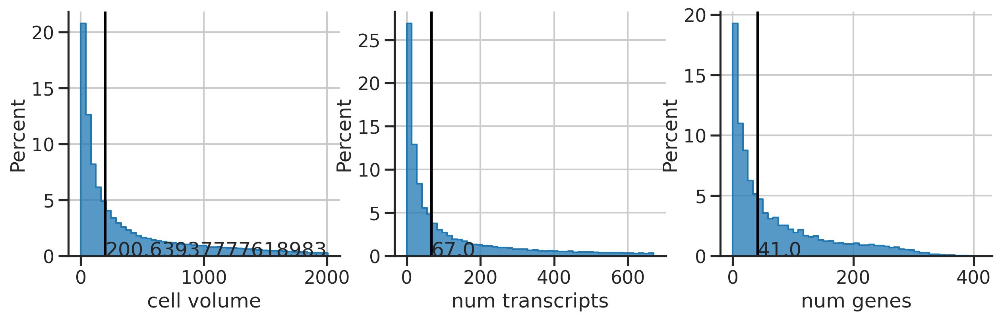

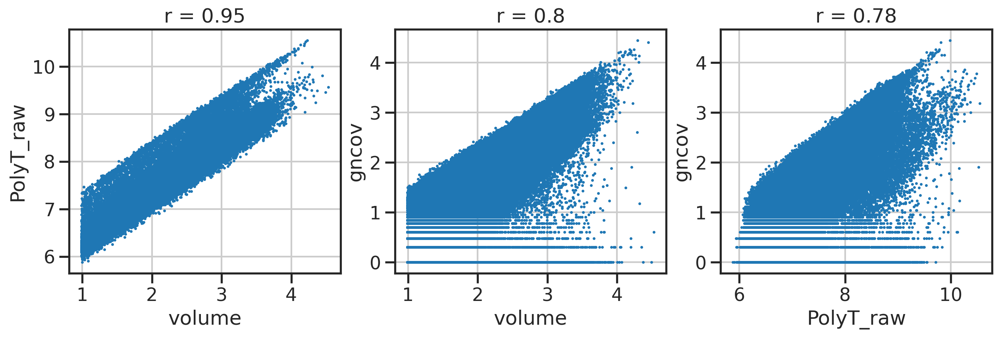

In [9]:
fig, axs = plt.subplots(1,3,figsize=(3*5,1*4))
for ax, (key, metric) in zip(axs, metrics.items()):
    (name, val, medval, bins) = metric
    
    sns.histplot(val, element='step', bins=bins, ax=ax, stat='percent')
    sns.despine(ax=ax)
    ax.axvline(medval, color='k',)
    ax.text(medval, 0, medval)
    ax.set_xlabel(name)
plt.show()


factors = np.array(['volume', 'PolyT_raw', 'gncov'])
pairs = [[0,1], [0,2], [1,2]]
fig, axs = plt.subplots(1,3,figsize=(3*5,1*4))
for pair, ax in zip(pairs, axs):
    f0 = factors[pair[0]]
    f1 = factors[pair[1]]
    x, y = np.log10(1+df[f0]), np.log10(1+df[f1])
    r, p = stats.pearsonr(x, y)
    ax.scatter(x, y, s=1)
    ax.set_xlabel(f0)
    ax.set_ylabel(f1)
    ax.set_title(f'r = {r:.2g}')
    
plt.show()

# rotation

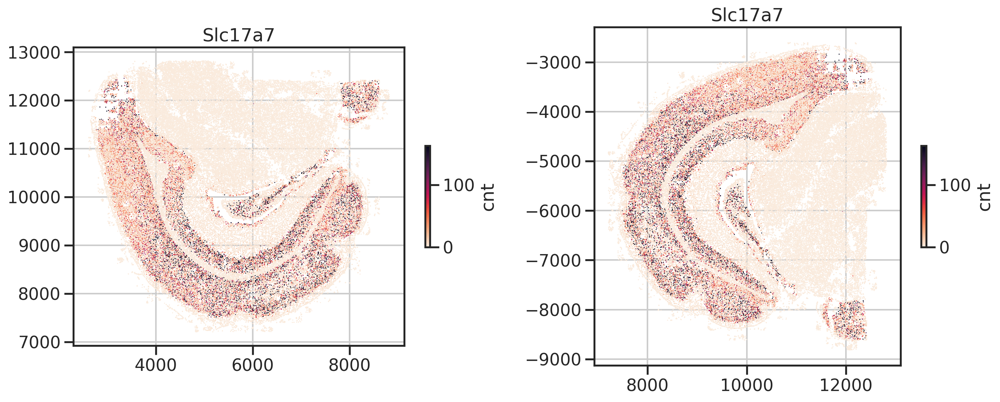

In [10]:
# calibrate coordinates
rotation = -90
meta_operations['rotation'] = rotation

x = adata.obs['center_x']
y = adata.obs['center_y']
xr, yr = rot2d(x, y, rotation)
adata.obs['x'] = xr
adata.obs['y'] = yr

gn = 'Slc17a7'
g = adata[:,gn].X.reshape(-1,)
fig, axs = plt.subplots(1,2,figsize=(2*8,1*6))
ax1, ax2 = axs
st_scatter_ax(fig, ax1, x,  y,  gexp=g, title=gn, cbar_label='cnt', axis_off=False)
st_scatter_ax(fig, ax2, xr, yr, gexp=g, title=gn, cbar_label='cnt', axis_off=False)
plt.show()

# filter #1 basic QC metrics

In [11]:
print(adata.shape)
# basic QC filter
cond = np.all([
    adata.obs['volume'] > 50, 
    adata.obs['volume'] < 2000, 
    adata.obs['fpcov'] < 5,
    adata.obs['gncov'] > 10,
], axis=0)

adata = adata[cond]
print(adata.shape)

(137991, 500)
(77700, 500)


# filter #2 spatial outlier

In [12]:
# this can iterate
indices_selected, XY = get_largest_spatial_components(adata)
adatasub = adata[indices_selected]
adatasub

fraction of cells included:  1.00


View of AnnData object with n_obs × n_vars = 77548 × 500
    obs: 'EntityID', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'DreO_raw', 'DreO_high_pass', 'Cre_raw', 'Cre_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'FlpO_raw', 'FlpO_high_pass', 'Pvalb_raw', 'Pvalb_high_pass', 'Sst_raw', 'Sst_high_pass', 'Fth1_raw', 'Fth1_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'gncov', 'gnnum', 'fpcov', 'x', 'y'
    obsm: 'blanks'

Text(0.5, 1.0, 'num genes')

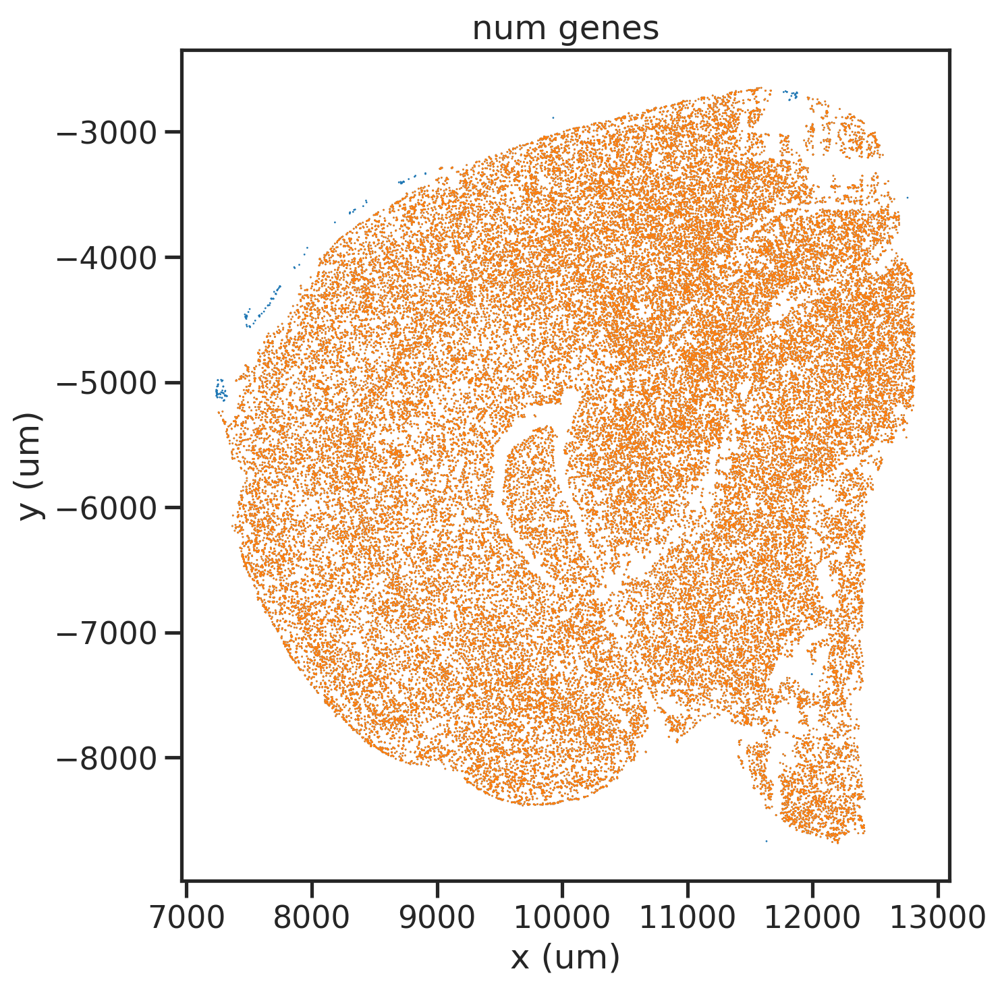

In [13]:
fig, ax = plt.subplots(figsize=(12,8))
ax.scatter(XY[:,0], 
           XY[:,1], edgecolor='none', s=1)
ax.scatter(XY[:,0][indices_selected], 
           XY[:,1][indices_selected], edgecolor='none', s=1)
ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'{name}')

# Get reference line

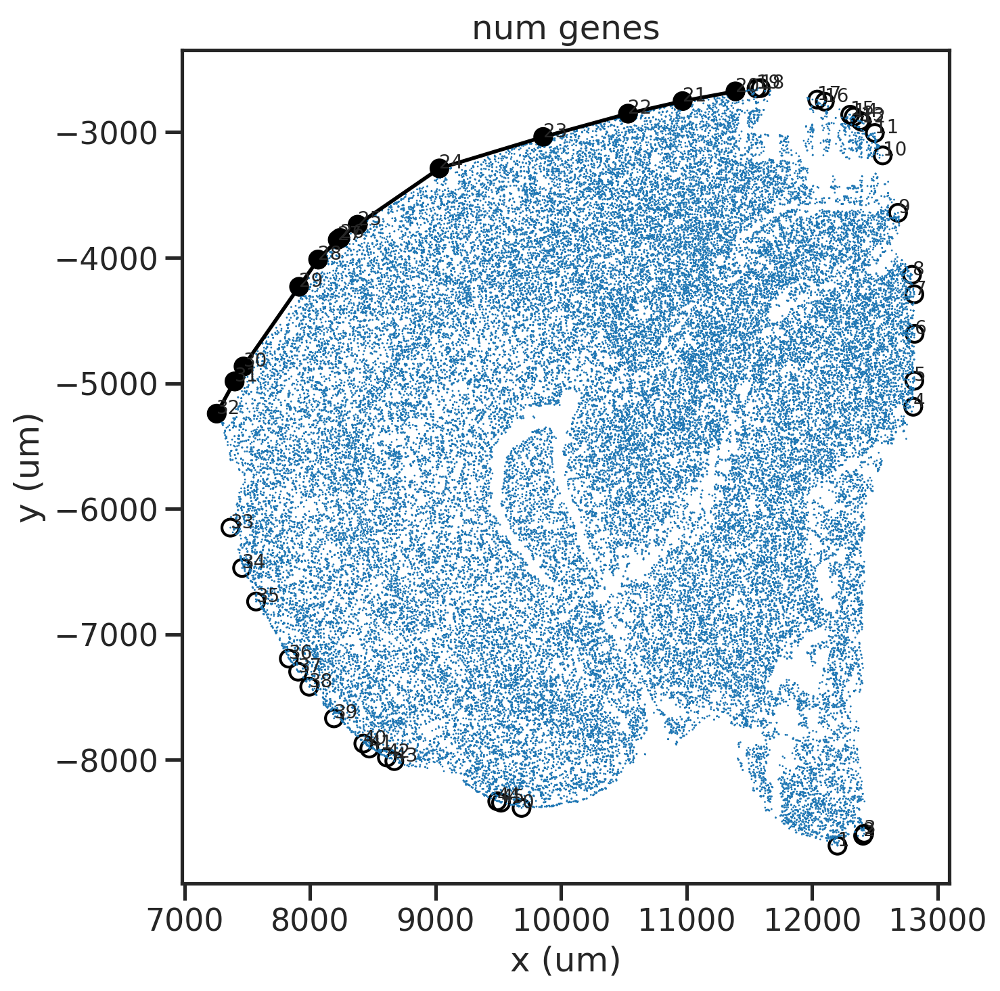

In [14]:
# adatasub -> meta -> XY

# prep
meta = adatasub.obs.copy()
XY = meta[['x', 'y']].values
nc = len(XY)

# convex hull points
hull = spatial.ConvexHull(XY)
points = XY[hull.vertices]

# ### --- add new points
# gapi, gapj = 30,31
# newp = 1/2*(points[gapi]+points[gapj])+np.array([0,-30])
# points = np.vstack([points[:gapj], newp, points[gapj:]])
# ### --- end of add new points

# select useful points
pia_curve = points[20:33][::-1]
x = pia_curve[:,0]
y = pia_curve[:,1]

fig, ax = plt.subplots(figsize=(12,8))
for i, point in enumerate(points):
    ax.scatter(point[0], point[1], facecolors='none', edgecolors='k')
    ax.text(point[0], point[1], i, fontsize=10)
ax.plot(x, y, '-ok', label='raw', linewidth=2,)
ax.scatter(XY[:,0], XY[:,1], edgecolor='none', s=1)

ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'{name}')

plt.show()

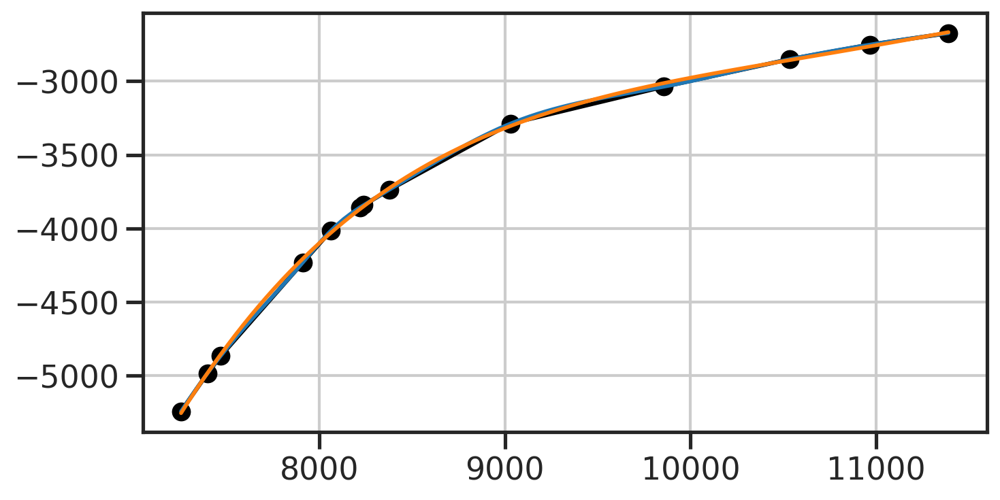

In [15]:
# Smooth using cubic spline interpolation
x_smooth = np.linspace(min(x), max(x), 100)
y_smooth = CubicSpline(x, y)(x_smooth)

# Generate x values for the fitted curve
coefficients = np.polyfit(x, y, 4)
poly_fit = np.poly1d(coefficients)
x_fit = np.linspace(min(x), max(x), 100)
y_fit = poly_fit(x_fit)

# check and choose
fig, ax = plt.subplots(figsize=(8,4))
ax.plot(x, y, '-ok')    
ax.plot(x_smooth, y_smooth, '-', label='Smoothed (Cubic Spline)', linewidth=2)
ax.plot(x_fit, y_fit, '-', label='Smoothed (poly)', linewidth=2)
plt.show()



In [16]:
## use and save record
# choose from [x_smooth, y_smooth] or [x_fit, y_fit]

# pia_curve_chosen = np.vstack([x_smooth, y_smooth]).T
pia_curve_chosen = np.vstack([x_fit, y_fit]).T
pia_curve_chosen_obj = RefLineSegs(pia_curve_chosen)
# save
meta_operations['ref_line'] = pia_curve_chosen.tolist()

# depth
meta['depth'] = pia_curve_chosen_obj.ndist_to_qps(XY)
meta['width'] = pia_curve_chosen_obj.tdist_to_qps(XY)

# bin it 
depth_bins, depth_binned = binning(meta['depth'].values, 20)
meta['depth_bin'] = depth_binned

width_bins, width_binned = binning(meta['width'].values, 20)
meta['width_bin'] = width_binned

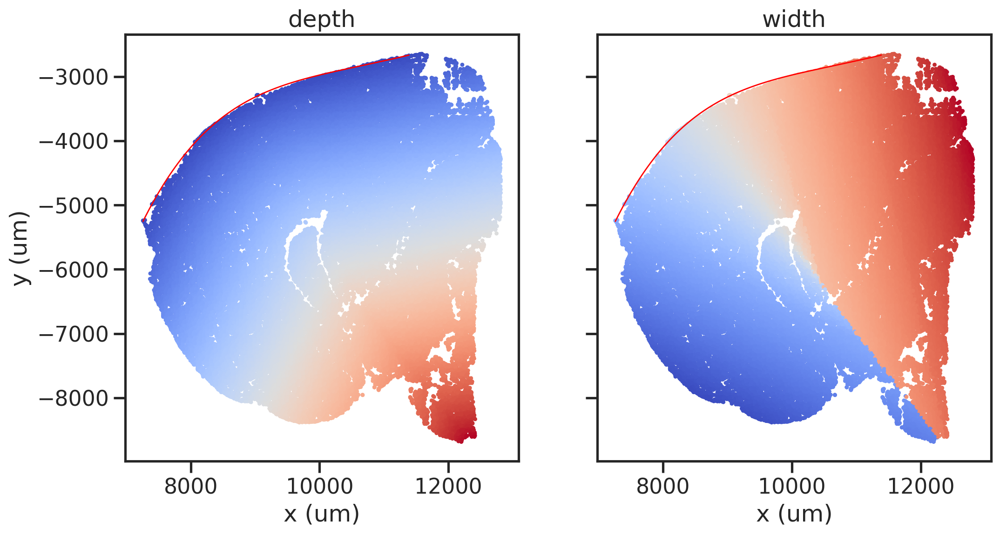

In [17]:
fig, axs = plt.subplots(1,2,figsize=(12,8*2), sharex=True, sharey=True)
for ax, lbl in zip(axs, ['depth', 'width']):
    
    ax.plot(pia_curve_chosen[:,0], 
            pia_curve_chosen[:,1], '-r', linewidth=1)
    

    sns.scatterplot(data=meta, x='x', y='y', 
                    hue=lbl, 
                    palette='coolwarm',
                    legend=False,
                    s=10, edgecolor='none', ax=ax)
    ax.grid(False)
    ax.set_aspect('equal')
    ax.set_xlabel('x (um)')
    ax.set_ylabel('y (um)')
    ax.set_title(f'{lbl}')


# filter #3. select cortex

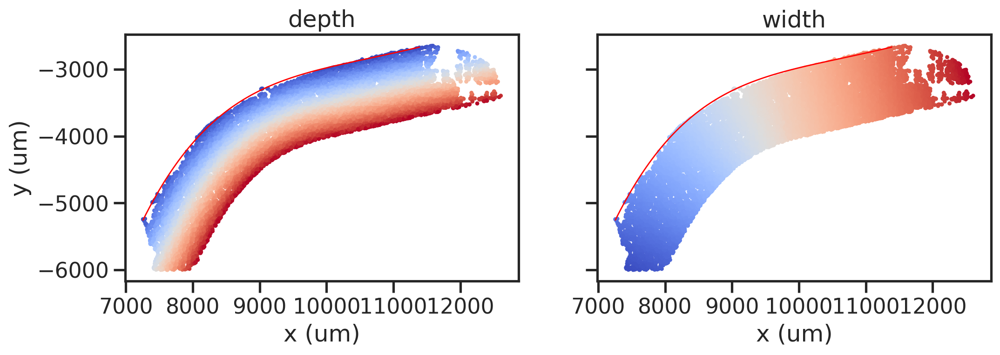

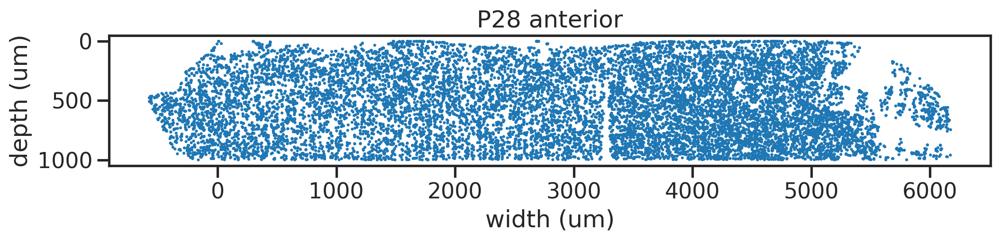

In [18]:
cond = np.all([
    meta['depth'] < 1000,
    # meta['width'] > 1000,
    # meta['width'] < 6000,
    meta['y'] >-6000, # 9000,
    ], axis=0)

adatasub2 = adatasub[cond].copy()
adatasub2.obs['depth'] = meta[cond]['depth']
adatasub2.obs['width'] = meta[cond]['width']
meta2 = adatasub2.obs


fig, axs = plt.subplots(1,2,figsize=(12,8*2), sharex=True, sharey=True)
for ax, lbl in zip(axs, ['depth', 'width']):
    
    ax.plot(pia_curve_chosen[:,0], 
            pia_curve_chosen[:,1], '-r', linewidth=1)
    

    sns.scatterplot(data=meta2, x='x', y='y', 
                    hue=lbl, 
                    palette='coolwarm',
                    legend=False,
                    s=10, edgecolor='none', ax=ax)
    ax.grid(False)
    ax.set_aspect('equal')
    ax.set_xlabel('x (um)')
    ax.set_ylabel('y (um)')
    ax.set_title(f'{lbl}')
    
fig, ax = plt.subplots(1,1,figsize=(12,4*1))
sns.scatterplot(data=meta2, x='width', y='depth', s=5, edgecolor='none', ax=ax)
ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('width (um)')
ax.set_ylabel('depth (um)')
ax.set_title(f'P28 anterior')
ax.invert_yaxis()
# ax.legend(bbox_to_anchor=(1,1))

# Redo QC, add norm, PCA

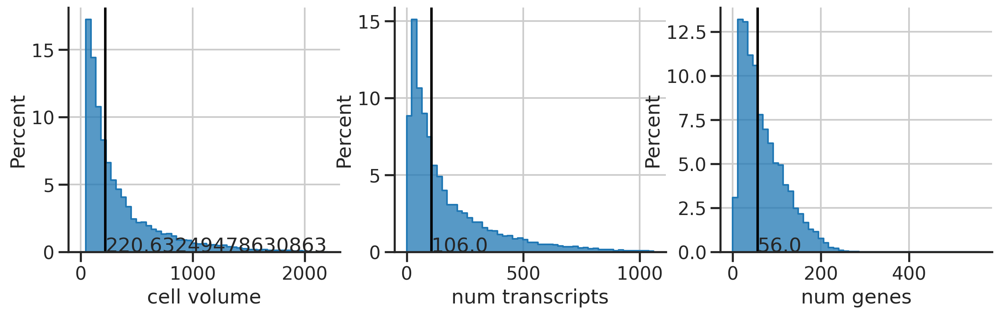

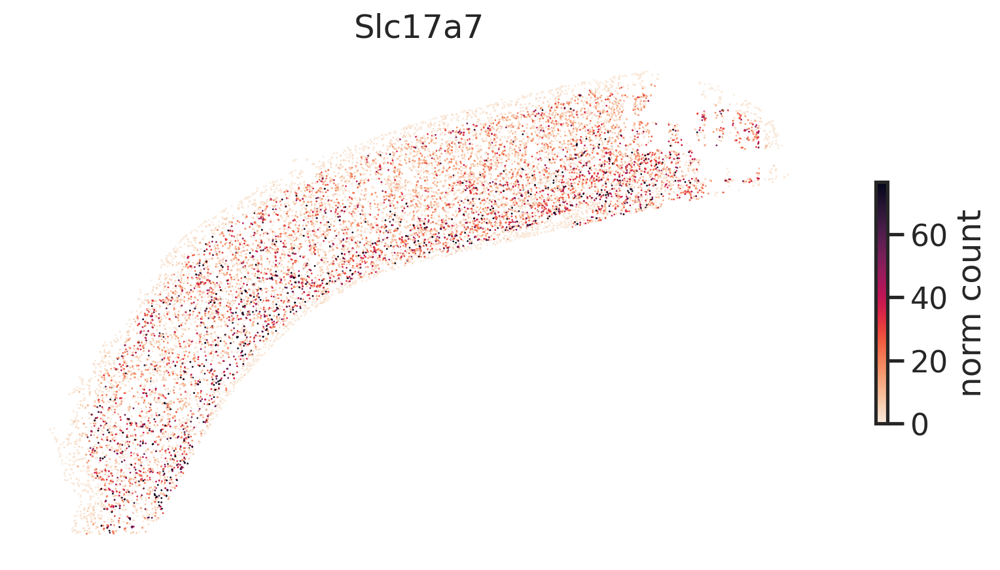

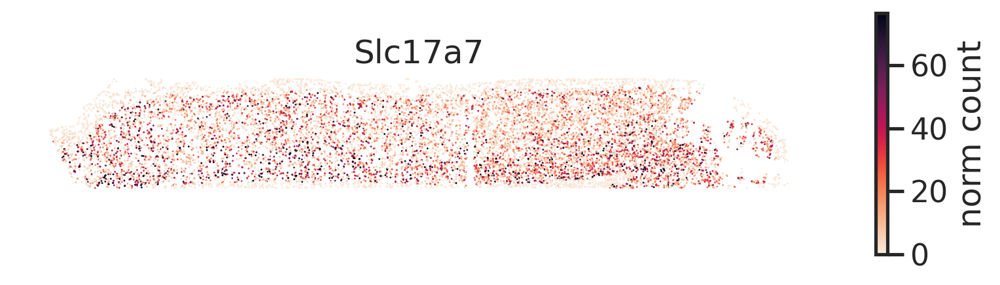

In [19]:
# redo metrics
metrics = get_qc_metrics(adatasub2.obs)
# norm
nrmcnts = get_norm_counts(adatasub2)
# pca
adatasub2.obsm['pca'] = PCA(n_components=10).fit_transform(adatasub2.layers['norm'])


# check QCs
fig, axs = plt.subplots(1,3,figsize=(3*5,1*4))
for ax, (key, metric) in zip(axs, metrics.items()):
    (name, val, medval, bins) = metric
    
    sns.histplot(val, element='step', bins=bins, ax=ax, stat='percent')
    sns.despine(ax=ax)
    ax.axvline(medval, color='k',)
    ax.text(medval, 0, medval)
    ax.set_xlabel(name)
plt.show()

# check
gn = 'Slc17a7'
xr = adatasub2.obs['x']
yr = adatasub2.obs['y']
g = adatasub2[:,gn].layers['norm']
st_scatter(xr, yr, gexp=g, title=gn, cbar_label='norm count', axis_off=True)
plt.show()

# check
gn = 'Slc17a7'
d = adatasub2.obs['depth']
w = adatasub2.obs['width']
g = adatasub2[:,gn].layers['norm']
st_scatter(w, -d, gexp=g, title=gn, cbar_label='norm count', axis_off=True)
plt.show()

# Annotate V1 boundaries
- and add that to meta_operations

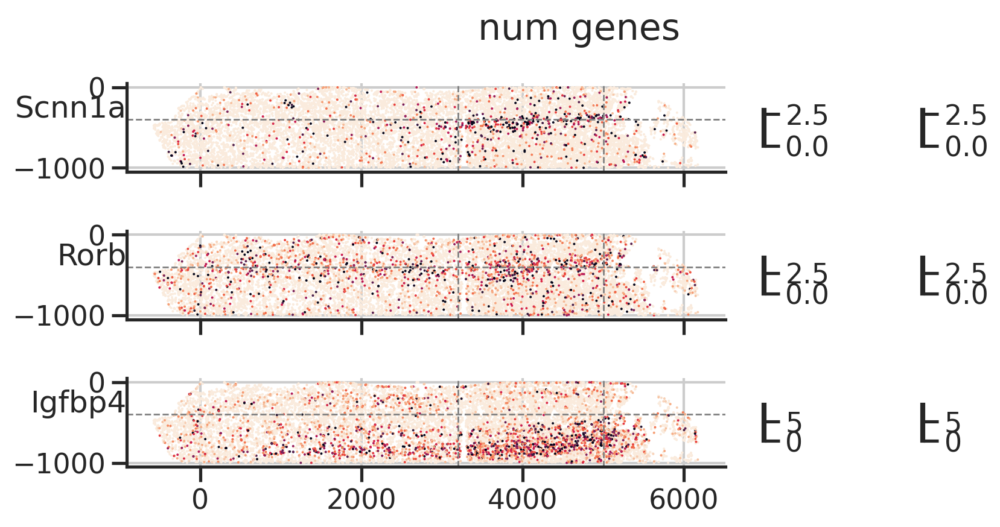

In [20]:

bound_l, bound_r, bound_d = 3200, 5000, 400
cond = np.all([
    adatasub2.obs['width'] > bound_l, 
    adatasub2.obs['width'] < bound_r, 
    adatasub2.obs['depth'] < bound_d, 
], axis=0)
adatasub2.obs['inside_v1l23'] = cond
meta_operations['bound_lrd'] = [bound_l, bound_r, bound_d]

gns = ['Scnn1a', 'Rorb', 'Igfbp4', ]
n = len(gns)
x =  adatasub2.obs['width']
y = -adatasub2.obs['depth']

fig, axs = plt.subplots(n,1,figsize=(1*10,n*1.5), sharex=True, sharey=True)
fig.suptitle(name)
for ax, gn in zip(axs, gns):
    g = adatasub2[:,gn].layers['norm'].reshape(-1,)
    
    vmax = np.percentile(g, 99)
    vmin = np.percentile(g,  5)
    cond = g > 1e-5
    
    utils_merfish.st_scatter_ax(fig, ax, x[~cond], y[~cond], gexp=g[~cond], s=2, title='', vmin=vmin, vmax=vmax, cmap='rocket_r') #, axis_off=False)
    utils_merfish.st_scatter_ax(fig, ax,  x[cond],  y[cond],  gexp=g[cond], s=2, title='', vmin=vmin, vmax=vmax, cmap='rocket_r') #, axis_off=False)
    
    ax.set_title(gn, loc='left', ha='right', y=0.5)
    ax.axhline(-bound_d, linestyle='--', linewidth=1, color='gray', zorder=2)
    ax.axvline( bound_l, linestyle='--', linewidth=1, color='gray', zorder=2)
    ax.axvline( bound_r, linestyle='--', linewidth=1, color='gray', zorder=2)
    ax.grid(True)
    ax.axis('on')
    sns.despine(ax=ax)
    
plt.show()

In [21]:
adatasub2.uns = meta_operations
adatasub2

AnnData object with n_obs × n_vars = 17553 × 500
    obs: 'EntityID', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'DreO_raw', 'DreO_high_pass', 'Cre_raw', 'Cre_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'FlpO_raw', 'FlpO_high_pass', 'Pvalb_raw', 'Pvalb_high_pass', 'Sst_raw', 'Sst_high_pass', 'Fth1_raw', 'Fth1_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'gncov', 'gnnum', 'fpcov', 'x', 'y', 'depth', 'width', 'inside_v1l23'
    uns: 'rotation', 'ref_line', 'bound_lrd'
    obsm: 'blanks', 'pca'
    layers: 'norm'

In [22]:
print(output)

/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28DR_pos_ctxglut_240411.h5ad


In [23]:
adatasub2.write(output)

In [24]:
!ls /u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/

P14NR_ant_ctxglut_240307.h5ad
P14NR_pos_ctxglut_240307.h5ad
P21DR_ant_ctxglut_240307.h5ad
P21DR_pos_ctxglut_240307.h5ad
P21NR_ant_ctxglut_240307.h5ad
P21NR_pos_ctxglut_240307.h5ad
P28DR_ant_ctxglut_240307.h5ad
P28DR_ant_ctxglut_240315.h5ad
P28DR_ant_ctxglut_240318.h5ad
P28DR_ant_ctxglut_240318_xy_operations.json
P28DR_pos_ctxglut_240307.h5ad
P28DR_pos_ctxglut_240315.h5ad
P28DR_pos_ctxglut_240318.h5ad
P28DR_pos_ctxglut_240318_xy_operations.json
P28DR_pos_ctxglut_240411.h5ad
P28NR_ant_ctxglut_240307.h5ad
P28NR_ant_ctxglut_240315.h5ad
P28NR_ant_ctxglut_240318.h5ad
P28NR_ant_ctxglut_240318_xy_operations.json
P28NR_ant_ctxglut_240411.h5ad
P28NR_pos_ctxglut_240307.h5ad
P28NR_pos_ctxglut_240315.h5ad
P28NR_pos_ctxglut_240318.h5ad
P28NR_pos_ctxglut_240318_xy_operations.json
P28NR_pos_ctxglut_240411.h5ad
